<a href="https://colab.research.google.com/github/UpalRoy-Decisionscientist/Machine-Learning/blob/master/California_house_price_Prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**California Housing Price Prediction**

**Project 4**
 
 Submitted By: Upal Roy

**Description:**
**Background of Problem Statement :**
The US Census Bureau has published California Census Data which has 10 types of metrics such as the population, median income, median housing price, and so on for each block group in California. The dataset also serves as an input for project scoping and tries to specify the functional and nonfunctional requirements for it.

**Problem Objective :**
The project aims at building a model of housing prices to predict median house values in California using the provided dataset. This model should learn from the data and be able to predict the median housing price in any district, given all the other metrics.
Districts or block groups are the smallest geographical units for which the US Census Bureau publishes sample data (a block group typically has a population of 600 to 3,000 people). There are 20,640 districts in the project dataset.

**Domain: Finance and Housing**
Analysis Tasks to be performed:
1. Build a model of housing prices to predict median house values in California using the provided dataset
2. Train the model to learn from the data to predict the median housing price in any district, given all the other metrics
3. Predict housing prices based on median_income and plot the regression chart for it

In [0]:
import pandas as pd
from matplotlib import pyplot as plt
import numpy as np
import seaborn as sns
%matplotlib inline

In [0]:
import numpy.random as rnd
from statsmodels.stats.outliers_influence import variance_inflation_factor
import statsmodels.api as sm

In [0]:
from sklearn.base import BaseEstimator,TransformerMixin,RegressorMixin

In [0]:
rnd.seed(42)

In [0]:
# Run this cell to mount My Google Drive.
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


**Exploratory Data Analysis :**

1.   Load the data 
2.   Handle missing values 
3.   Encode categorical data 

**1. Loading the data**

In [0]:
import os
base_dir = '/content/drive/My Drive/ML_Project/1553768847_housing.xlsx'

In [0]:
df = pd.read_excel(base_dir, sheetname='housing')

/usr/local/lib/python3.6/dist-packages/pandas/util/_decorators.py:188: FutureWarning: The `sheetname` keyword is deprecated, use `sheet_name` instead
  return func(*args, **kwargs)


In [0]:
df.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,median_house_value
0,-122.23,37.88,41,880,129.0,322,126,8.3252,NEAR BAY,452600
1,-122.22,37.86,21,7099,1106.0,2401,1138,8.3014,NEAR BAY,358500
2,-122.24,37.85,52,1467,190.0,496,177,7.2574,NEAR BAY,352100
3,-122.25,37.85,52,1274,235.0,558,219,5.6431,NEAR BAY,341300
4,-122.25,37.85,52,1627,280.0,565,259,3.8462,NEAR BAY,342200


**2. Handle Missing Values**

In [0]:
df.isnull().sum()

longitude               0
latitude                0
housing_median_age      0
total_rooms             0
total_bedrooms        207
population              0
households              0
median_income           0
ocean_proximity         0
median_house_value      0
dtype: int64

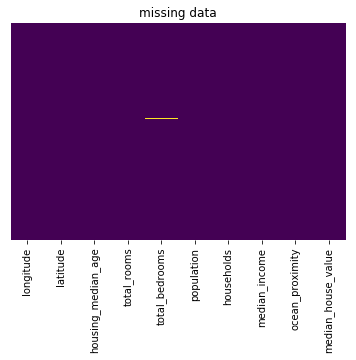

In [0]:
df.isnull().sum()
sns.heatmap(df.isnull(),cmap='viridis',cbar=False,yticklabels=False)

plt.title('missing data')
plt.show()

In [0]:
df['total_bedrooms'].describe()

count    20433.000000
mean       537.870553
std        421.385070
min          1.000000
25%        296.000000
50%        435.000000
75%        647.000000
max       6445.000000
Name: total_bedrooms, dtype: float64

Text(0, 0.5, 'frequency')

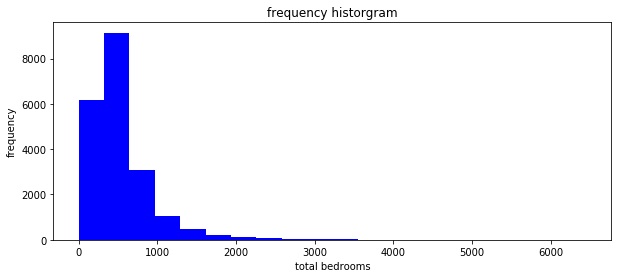

In [0]:
plt.figure(figsize=(10,4))
plt.hist(df[df['total_bedrooms'].notnull()]['total_bedrooms'],bins=20,color='Blue')#histogram of totalbedrooms
#data has some outliers
(df['total_bedrooms']>4000).sum()
plt.title('frequency historgram')
plt.xlabel('total bedrooms')
plt.ylabel('frequency')

<function matplotlib.pyplot.plot>

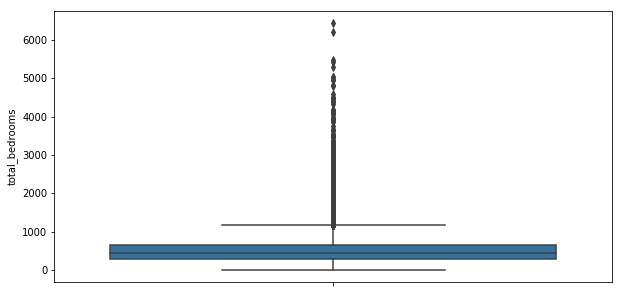

In [0]:
plt.figure(figsize=(10,5))
sns.boxplot(y='total_bedrooms',data=df)
plt.plot

In [0]:
#we will calculate the median for total_bedrooms based  upon categories of ocean_proximity column
def calc_categorical_median(x):
    """this function fill the missing values of total_bedrooms based upon categories of ocean_proximity"""
    unique_colums_ocean_proximity=x['ocean_proximity'].unique()
    for i in unique_colums_ocean_proximity:
        median=x[x['ocean_proximity']==i]['total_bedrooms'].median()
        x.loc[x['ocean_proximity']==i,'total_bedrooms'] =  x[x['ocean_proximity']==i]['total_bedrooms'].fillna(median)
calc_categorical_median(df)

In [0]:
print(df.isnull().sum())

longitude             0
latitude              0
housing_median_age    0
total_rooms           0
total_bedrooms        0
population            0
households            0
median_income         0
ocean_proximity       0
median_house_value    0
dtype: int64


In [0]:
print(df.dtypes)

longitude             float64
latitude              float64
housing_median_age      int64
total_rooms             int64
total_bedrooms        float64
population              int64
households              int64
median_income         float64
ocean_proximity        object
median_house_value      int64
dtype: object


In [0]:
df.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,-119.569704,35.631861,28.639486,2635.763081,536.852229,1425.476744,499.539680,3.870671,206855.816909
std,2.003532,2.135952,12.585558,2181.615252,419.390765,1132.462122,382.329753,1.899822,115395.615874
min,-124.350000,32.540000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000
25%,-121.800000,33.930000,18.000000,1447.750000,297.000000,787.000000,280.000000,2.563400,119600.000000
50%,-118.490000,34.260000,29.000000,2127.000000,435.000000,1166.000000,409.000000,3.534800,179700.000000
75%,-118.010000,37.710000,37.000000,3148.000000,643.250000,1725.000000,605.000000,4.743250,264725.000000
max,-114.310000,41.950000,52.000000,39320.000000,6445.000000,35682.000000,6082.000000,15.000100,500001.000000


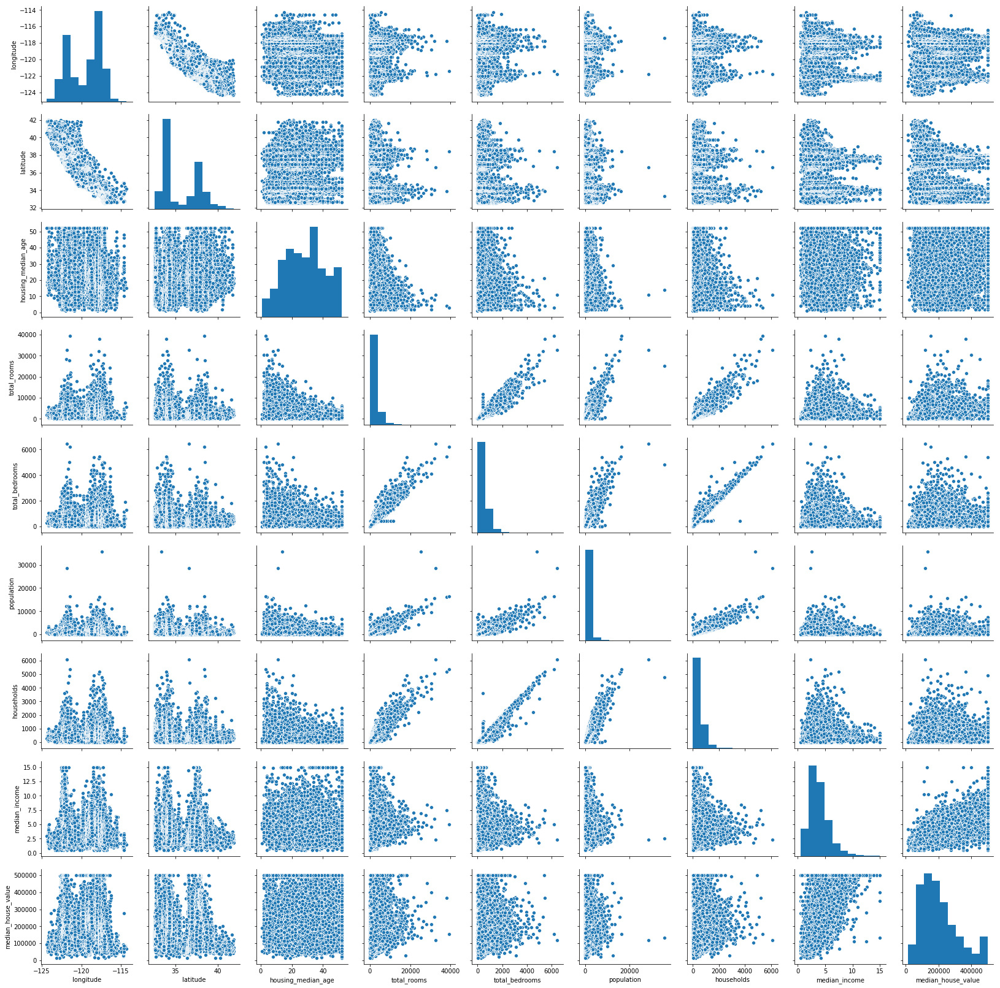

In [0]:
sns.pairplot(df)

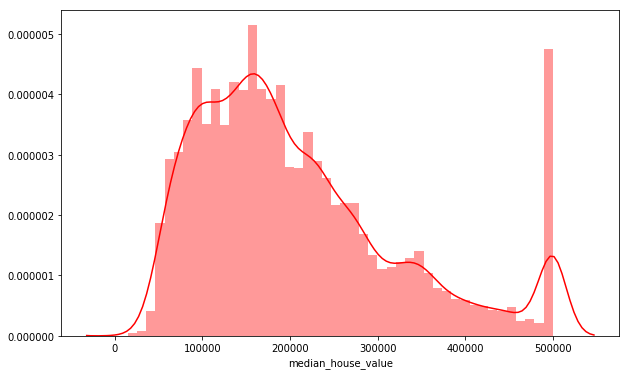

In [0]:
plt.figure(figsize=(10,6))
sns.distplot(df['median_house_value'],color='Red')
plt.show()

[]

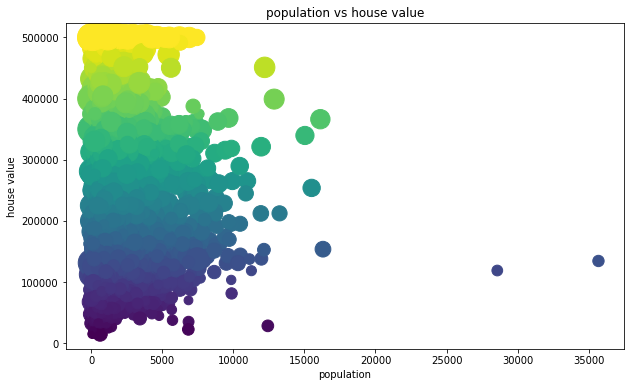

In [0]:
plt.figure(figsize=(10,6))

plt.scatter(df['population'],df['median_house_value'],c=df['median_house_value'],s=df['median_income']*50)
plt.colorbar
plt.title('population vs house value' )
plt.xlabel('population')
plt.ylabel('house value')
plt.plot()

**Outlier Handling**

In [0]:
df[df['median_house_value']>450000]['median_house_value'].value_counts().head()

500001    965
500000     27
475000      8
483300      6
466700      4
Name: median_house_value, dtype: int64

In [0]:
df=df.loc[df['median_house_value']<500001,:]

In [0]:
df=df[df['population']<25000]

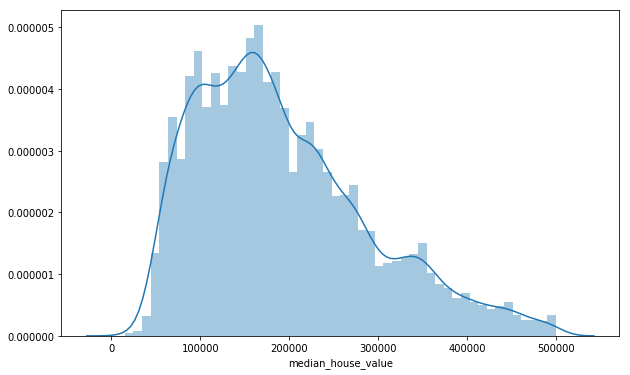

In [0]:
plt.figure(figsize=(10,6))
sns.distplot(df['median_house_value'])
plt.show()

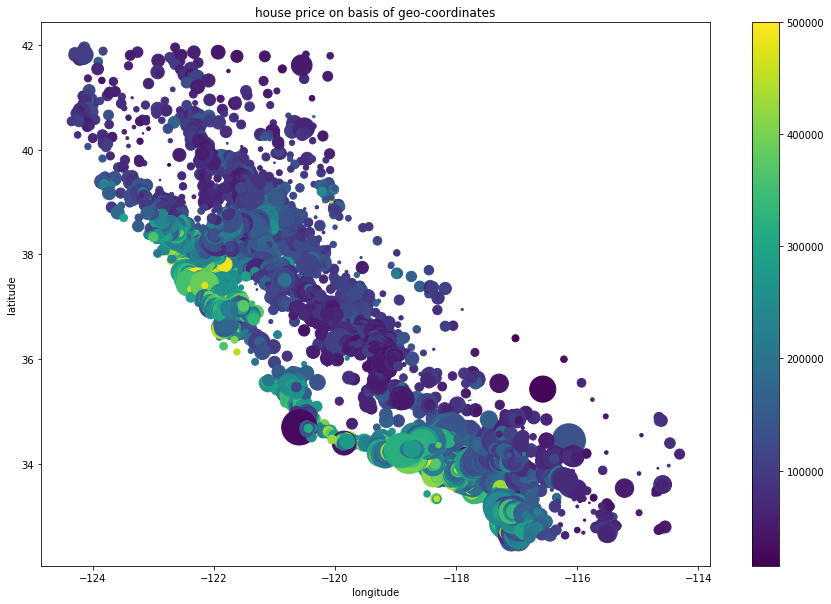

In [0]:
plt.figure(figsize=(15,10))
plt.scatter(df['longitude'],df['latitude'],c=df['median_house_value'],s=df['population']/10,cmap='viridis')
plt.colorbar()
plt.xlabel('longitude')
plt.ylabel('latitude')
plt.title('house price on basis of geo-coordinates')
plt.show()

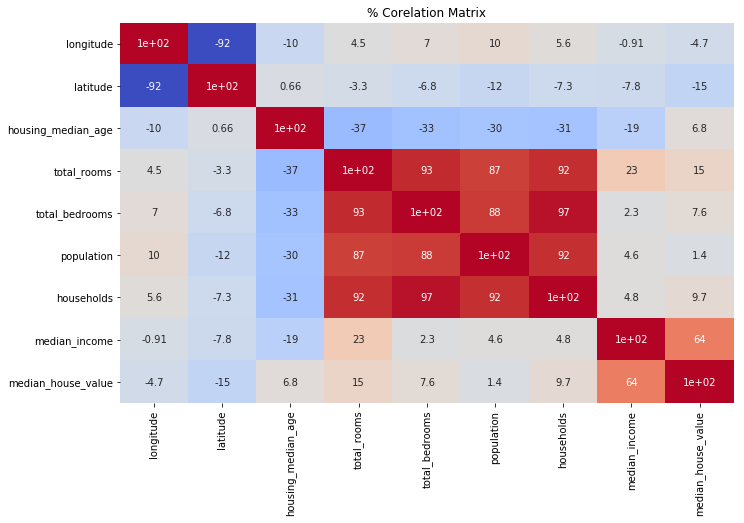

In [0]:
plt.figure(figsize=(11,7))
sns.heatmap(cbar=False,annot=True,data=df.corr()*100,cmap='coolwarm')
plt.title('% Corelation Matrix')
plt.show()

[]

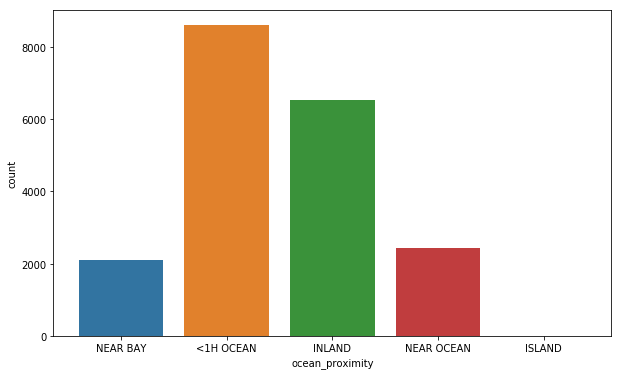

In [0]:
plt.figure(figsize=(10,6))
sns.countplot(data=df,x='ocean_proximity')
plt.plot()

[]

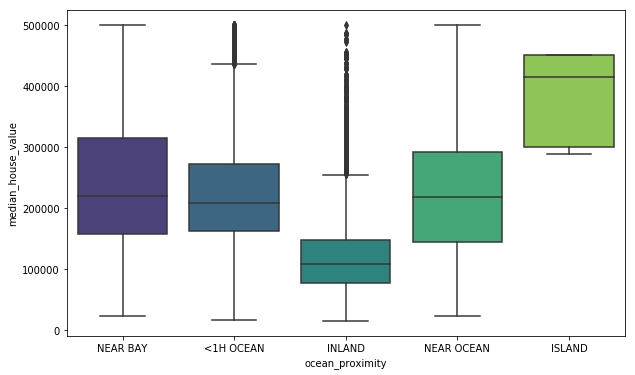

In [0]:
plt.figure(figsize=(10,6))
sns.boxplot(data=df,x='ocean_proximity',y='median_house_value',palette='viridis')
plt.plot()

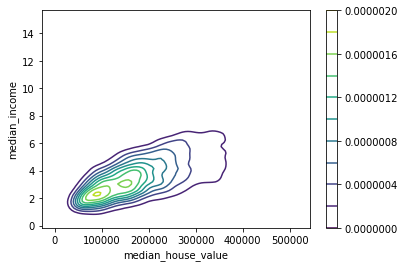

In [0]:
sns.kdeplot(df['median_house_value'],df['median_income'],cmap='viridis',cbar=True)

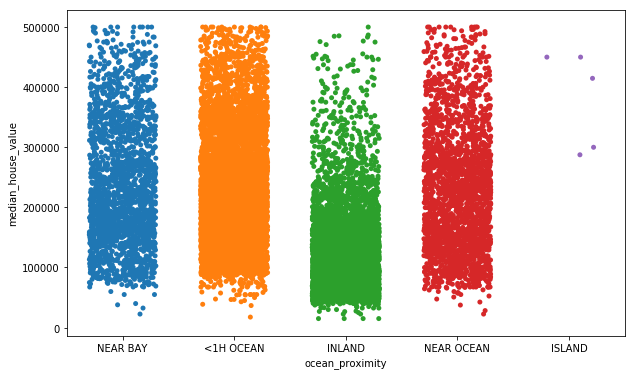

In [0]:
plt.figure(figsize=(10,6))

sns.stripplot(data=df,x='ocean_proximity',y='median_house_value',jitter=0.3)

3) Encoding Categorical Data

In [0]:
df=pd.concat([pd.get_dummies(df['ocean_proximity'],drop_first=True),df],axis=1).drop('ocean_proximity',axis=1)
df['income per working population']=df['median_income']/(df['population']-df['households'])
df['bed per house']=df['total_bedrooms']/df['total_rooms']
df['h/p']=df['households']/df['population']

In [0]:
def type_building(x):
    if x<=10:
        return "new"
    elif x<=30:
        return 'mid old'
    else:
        return 'old'
df=pd.concat([df,pd.get_dummies(df['housing_median_age'].apply(type_building),drop_first=True)],axis=1)

In [0]:
x=df.drop('median_house_value',axis=1).values
y=df['median_house_value'].values

In [0]:
from sklearn.model_selection import train_test_split
xtrain,xtest,ytrain,ytest=train_test_split(x,y,test_size=0.3,random_state=10)

In [0]:
from sklearn.preprocessing import MinMaxScaler
ms=MinMaxScaler()
xtrain=ms.fit_transform(xtrain)
xtest=ms.transform(xtest)

In [0]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import  ElasticNet
from sklearn.linear_model import  Ridge
from sklearn.model_selection import cross_val_score
import  statsmodels.formula.api as sm
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import  Lasso
from sklearn.model_selection import GridSearchCV
import matplotlib
from sklearn.decomposition import  PCA
from sklearn.cluster import  KMeans

%matplotlib inline

In [0]:
def c_variance(x):
    total=0
    clist=[]
    for i in np.arange(0,xtrain.shape[1]):
        p=PCA(n_components=i+1)
        p.fit(x)
        total=total+p.explained_variance_ratio_[i]
        clist.append(total)
        
    return clist
x_train_variance=list(map(lambda x:x*100,c_variance(xtrain)))

Text(0.5, 1.0, 'comulative variance ratio of p.c.a components')

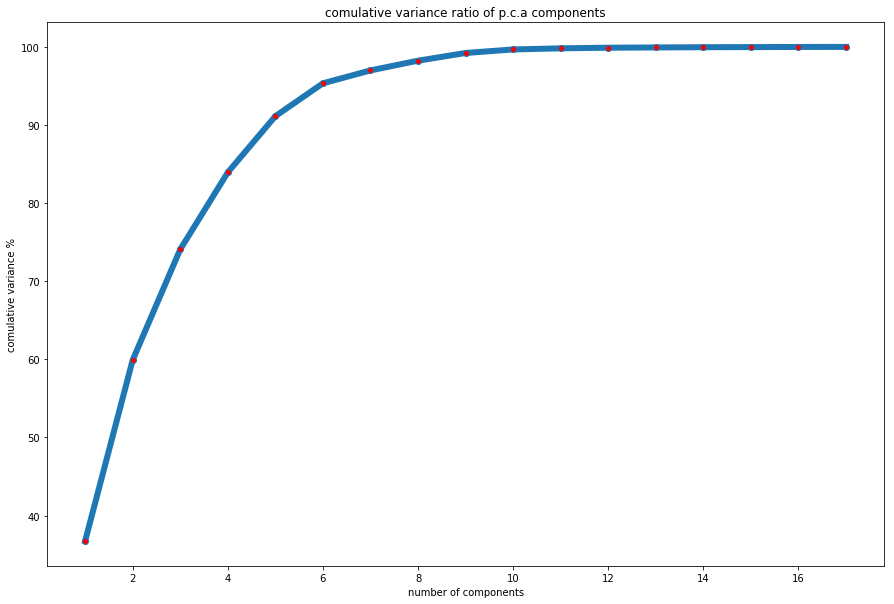

In [0]:
plt.figure(figsize=(15,10))
plt.plot(np.arange(1,xtrain.shape[1]+1),x_train_variance,marker='o',markerfacecolor='red',lw=6)
plt.xlabel('number of components')
plt.ylabel('comulative variance %')
plt.title('comulative variance ratio of p.c.a components')

/usr/local/lib/python3.6/dist-packages/seaborn/axisgrid.py:2262: UserWarning: The `size` paramter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


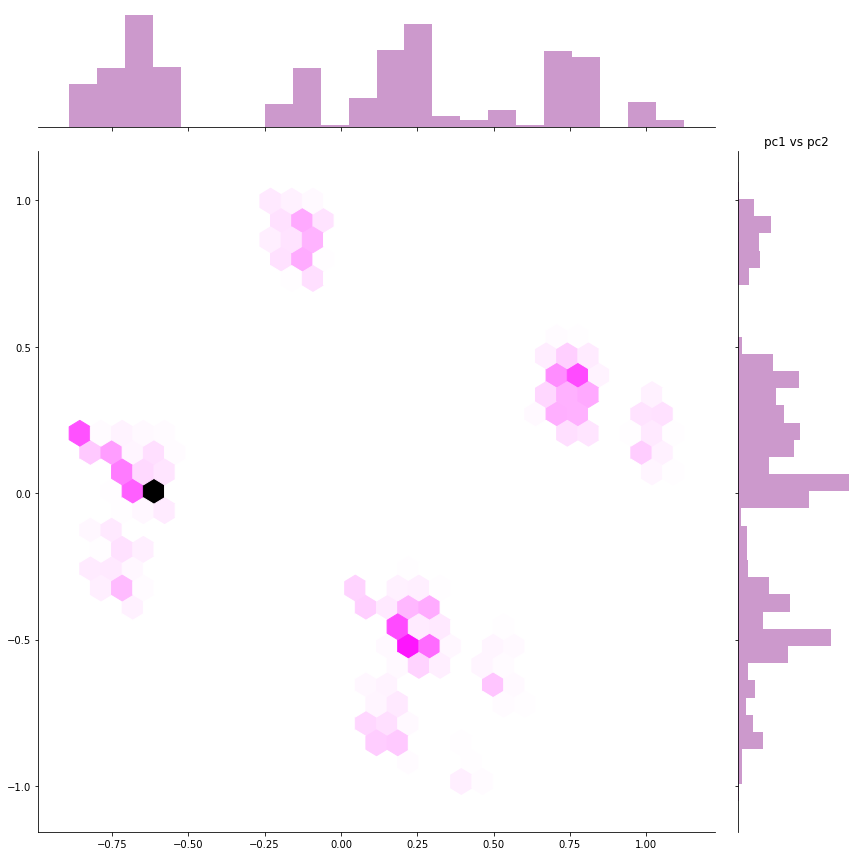

In [0]:
pca=PCA(n_components=2)
pca.fit(xtrain)
sns.jointplot(data={'pc1':pca.fit_transform(xtrain)[:,0],'pc2':pca.fit_transform(xtrain)[:,1]},x='pc1',y='pc2',size=12,kind='hex',color='purple')
plt.title('pc1 vs pc2')
plt.show()

In [0]:
p_train=pca.fit_transform(xtrain)

In [0]:
best=[]
for i in range(1,10):
    k=KMeans(n_clusters=i)
    k.fit(xtrain)
    best.append(k.inertia_)

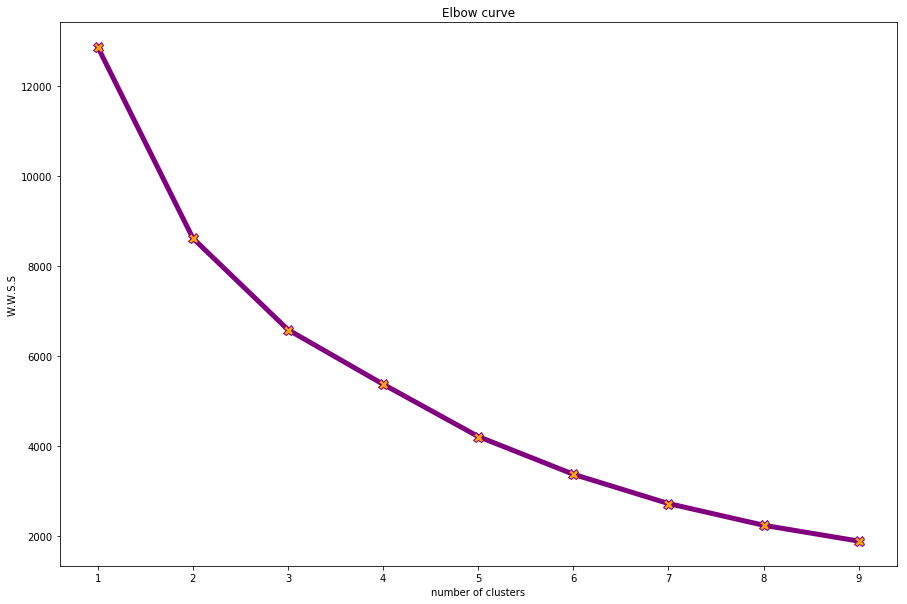

In [0]:
plt.figure(figsize=(15,10))
plt.plot(np.arange(1,len(best)+1),best,marker='X',markerfacecolor='orange',markersize=10,lw=5,color='purple')
plt.title('Elbow curve')
plt.xlabel('number of clusters')
plt.ylabel('W.W.S.S')
plt.show()

In [0]:
k=KMeans(n_clusters=4)
kpred=k.fit_predict(xtrain)

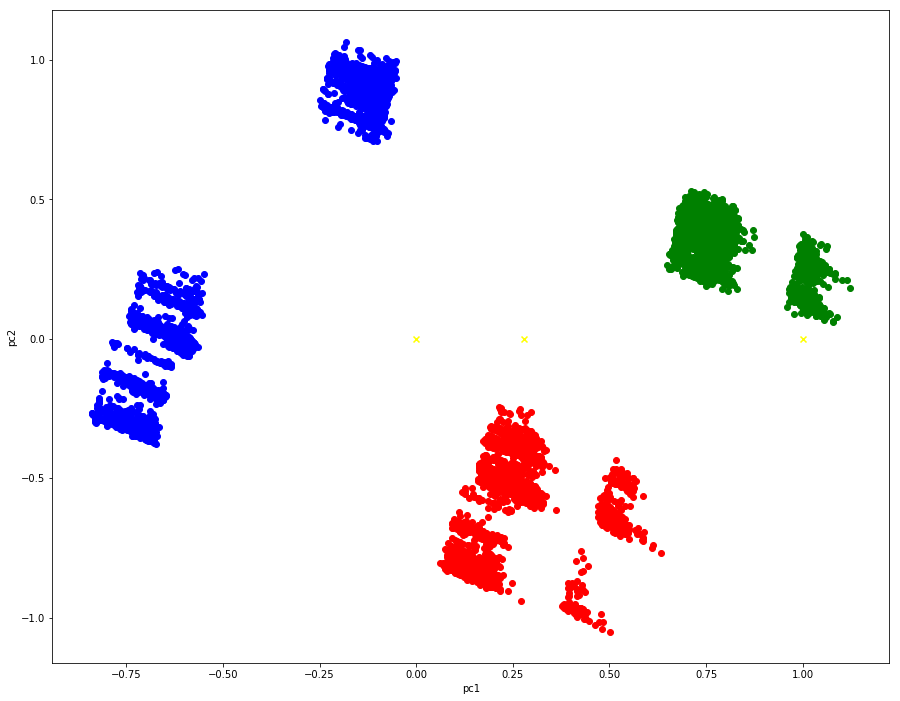

In [0]:
plt.figure(figsize=(15,12))
color=['red','green','blue','pink']
for i in range(3):
    plt.scatter(p_train[kpred==i][:,0],p_train[kpred==i][:,1],c=color[i])
    plt.scatter(k.cluster_centers_[i,0],k.cluster_centers_[i,1],c='yellow',marker='x')
    plt.xlabel('pc1')
    plt.ylabel('pc2')

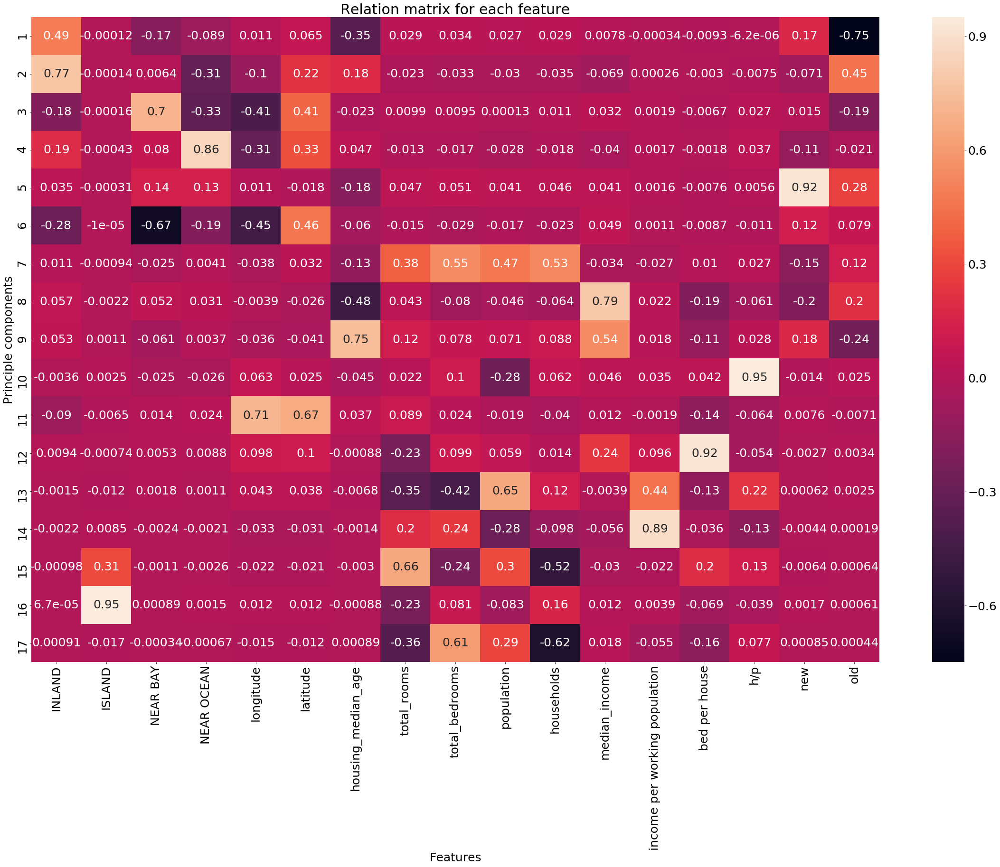

In [0]:
matplotlib.rcParams.update({'font.size': 25})
pca=PCA(n_components=None)
pca.fit(xtrain)
plt.figure(figsize=(40,25))
sns.heatmap(pca.components_,annot=True,xticklabels=df.drop('median_house_value',axis=1).columns,yticklabels=[str(i) for i in range(1,len(df.columns))])
plt.xlabel('Features')
plt.ylabel('Principle components')
plt.title('Relation matrix for each feature')
plt.show()
matplotlib.rcParams.update({'font.size': 12})

**Perform Linear Regression** : 
* 		Perform Linear Regression on training data.
* 		Predict output for test dataset using the fitted model.
* 		Print root mean squared error (RMSE) from Linear Regression.
            [ HINT: Import mean_squared_error from sklearn.metrics ]

In [0]:
def regresssor_model(x,y,estimator):
   
    regressor=estimator()
    regressor.fit(x,y)
    lr_rmse=np.sqrt(mean_squared_error(y,regressor.predict(x)))
    cv_regressor=cross_val_score(cv=10,X=x,y=y,estimator=regressor,scoring='r2')
    print('The cross validated accuracy  - '+str(100*cv_regressor.mean()))
    print('The corss validated variance is - '+str(100*cv_regressor.std()))
    return regressor

def evaluate(ypred,ytest,regressor):
    plt.figure(figsize=(15,8))
    plt.xlabel('(ytest) - (ypred)')
    plt.ylabel('frequency')
    plt.title('residual plot')
    plt.hist(ytest-ypred)
    print("root mean squared error for test data   is "+str(np.sqrt(mean_squared_error(ytest,ypred))))
    plt.show()

In [0]:
plt.show()

In [0]:
#polynomial regression with all features
def to_poly(degree,xtrain,xtest):
    poly=PolynomialFeatures(degree=degree)
    X=poly.fit_transform(xtrain)
    x=poly.fit_transform(xtest)
    return (X,x)

Linear regression with most co related features
The cross validated accuracy  - 41.141982678752065
The corss validated variance is - 2.9137916902724514
root mean squared error for test data   is 75033.84537275766


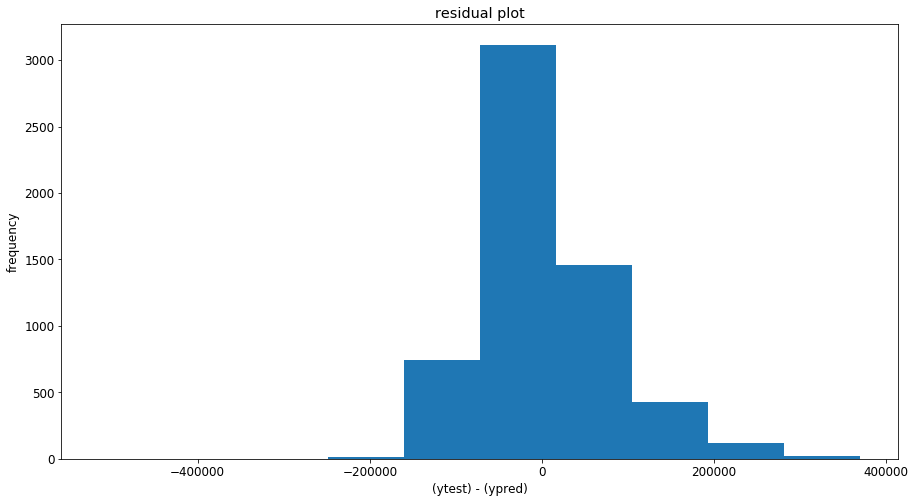

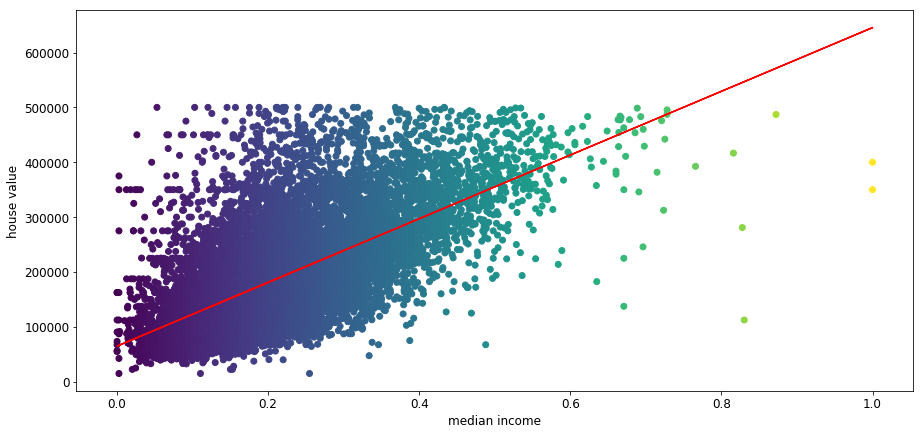

In [0]:
print('Linear regression with most co related features')
l=regresssor_model(xtrain[:,[11]],ytrain,LinearRegression)
evaluate(l.predict(xtest[:,[11]]),ytest,l)
plt.figure(figsize=(15,7))
plt.scatter(xtrain[:,11],ytrain,c=xtrain[:,11])
plt.plot(xtrain[:,11],l.predict(xtrain[:,11:12]),color='red')
plt.xlabel('median income')
plt.ylabel('house value')
plt.show()

Linear regression with all features
The cross validated accuracy  - 64.02862463950474
The corss validated variance is - 2.074616229580849
root mean squared error for test data   is 59048.33194484107


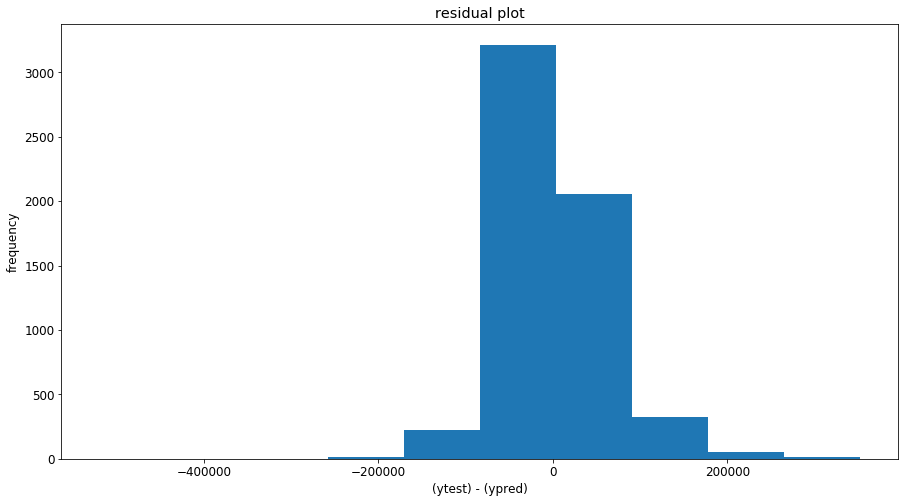

In [0]:
print('Linear regression with all features')
l=regresssor_model(xtrain,ytrain,LinearRegression)
evaluate(l.predict(xtest),ytest,l)

The cross validated accuracy  - 41.13075668001295
The corss validated variance is - 2.899198205670066
root mean squared error for test data   is 74967.59305620886


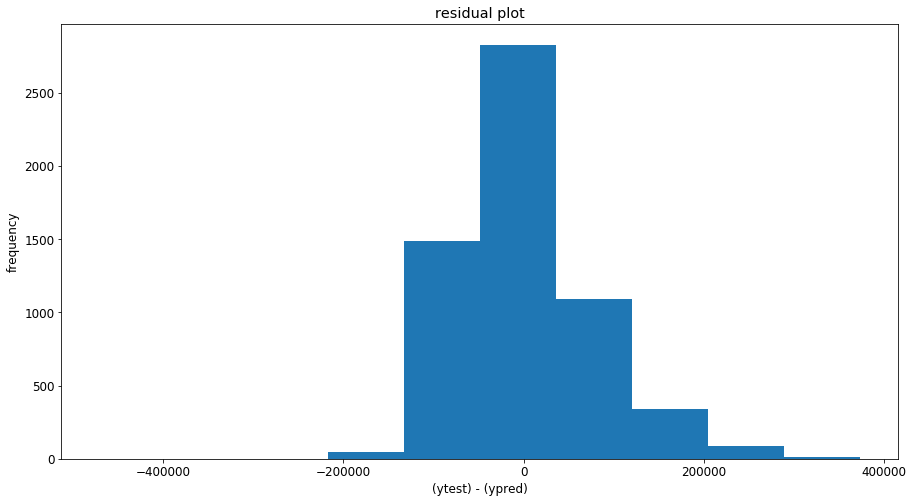

In [0]:
xtrain_poly,xtest_poly=to_poly(2,xtrain[:,11:12],xtest[:,11:12])
l=regresssor_model(xtrain_poly,ytrain,LinearRegression)
evaluate(l.predict(xtest_poly),ytest,l)

The cross validated accuracy  - -6.435100095457653e+19
The corss validated variance is - 1.703043623799689e+20
root mean squared error for test data   is 11586465582319.246


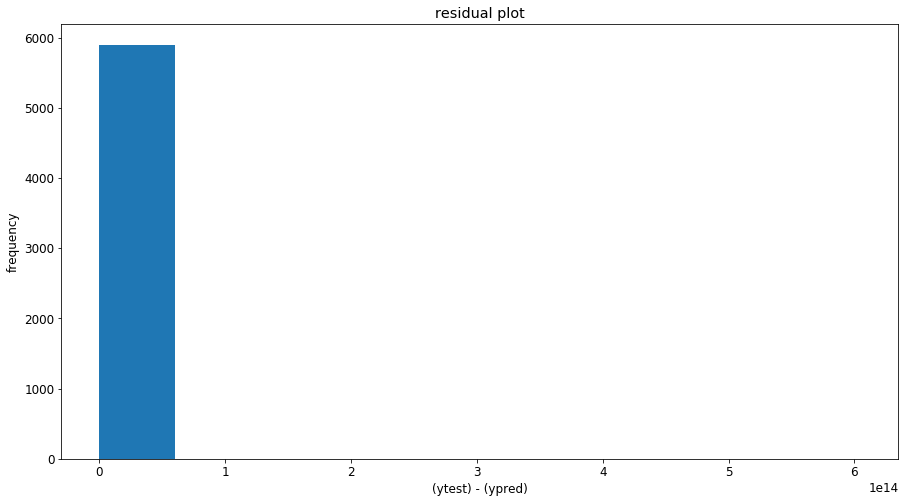

In [0]:
xtrain_poly,xtest_poly=to_poly(3,xtrain,xtest)
l=regresssor_model(xtrain_poly,ytrain,LinearRegression)
evaluate(l.predict(xtest_poly),ytest,l)

In [0]:
xtrain_ols=np.append(np.ones(xtrain.shape[0]).reshape(xtrain.shape[0],1),xtrain,axis=1)

In [0]:
xtest_ols=np.append(np.ones(xtest.shape[0]).reshape(xtest.shape[0],1),xtest,axis=1)

In [0]:
import statsmodels.api as sm

In [0]:
def backward_elimination(x,y_dependent,sl):
    var=np.arange(x.shape[1])
    x_ols_array=x[:,var]
    regressor=sm.OLS(y_dependent,x_ols_array).fit()
    for i in range(sum(regressor.pvalues>sl)):
        if sum(regressor.pvalues>sl)>0:
            arg=regressor.pvalues.argmax()
            var=np.delete(var,arg)
            x_ols_array=x[:,var]
            regressor=sm.OLS(y_dependent,x_ols_array).fit()
    return (var[:],regressor)

features,regressor=backward_elimination(xtrain_ols,ytrain,0.10)

In [0]:
features

array([ 0,  1,  2,  3,  5,  6,  7,  9, 11, 12, 13, 14, 15, 16, 17])

In [0]:
regressor.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.643
Model:                            OLS   Adj. R-squared:                  0.642
Method:                 Least Squares   F-statistic:                     1768.
Date:                Tue, 23 Jul 2019   Prob (F-statistic):               0.00
Time:                        18:37:37   Log-Likelihood:            -1.7066e+05
No. Observations:               13771   AIC:                         3.413e+05
Df Residuals:                   13756   BIC:                         3.415e+05
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       2.003e+05   1.25e+04     16.015      0.000    1.76e+05    2.25e+05
x1         -3.464e+04   1775.623    -19.508      0.000   -3.81e+04   -3.12e+04
x2           2.23e+05   4.13e+04      5.400      0.000    1.42e+05    3.04e+05
x3         -1.094e+04   1969.130     -5.556      0.000   -1.48e+04   -7080.270
x4         -2.413e+05   9983.380    -24.171      0.000   -2.61e+05   -2.22e+05
x5         -2.201e+05   9410.497    -23.394      0.000   -2.39e+05   -2.02e+05
x6          6.834e+04   4559.172     14.990      0.000    5.94e+04    7.73e+04
x7           1.79e+05   3.16e+04      5.662      0.000    1.17e+05    2.41e+05
x8          -1.25e+05   3.28e+04     -3.817      0.000   -1.89e+05   -6.08e+04
x9          5.865e+05   6362.090     92.193      0.000    5.74e+05    5.99e+05
x10        -2.586e+05   2.94e+04     -8.786      0.000   -3.16e+05   -2.01e+05
x11         2.361e+05   1.86e+04     12.701      0.000       2e+05    2.73e+05
x12         3.569e+05   8119.224     43.963      0.000    3.41e+05    3.73e+05
x13         5074.5450   2309.514      2.197      0.028     547.583    9601.507
x14        -1.021e+04   1945.628     -5.246      0.000    -1.4e+04   -6392.179
==============================================================================
Omnibus:                     2370.251   Durbin-Watson:                   2.016
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             6727.697
Skew:                           0.917   Prob(JB):                         0.00
Kurtosis:                       5.891   Cond. No.                         138.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [0]:
np.sqrt(mean_squared_error(ytest,regressor.predict(xtest_ols[:,features])))

59072.08625032726

Text(0.5, 1.0, 'coeff graph')

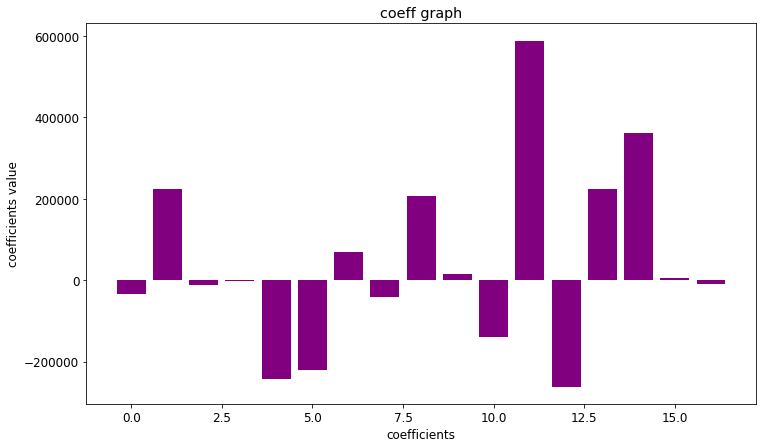

In [0]:
l=LinearRegression()
plt.figure(figsize=(12,7))
l.fit(xtrain,ytrain)
plt.bar(np.arange(len(l.coef_)),l.coef_,color='purple')
plt.xlabel('coefficients')
plt.ylabel('coefficients value')
plt.title('coeff graph')

Regression: Lasso

The cross validated accuracy  - 64.03091881493384
The corss validated variance is - 2.076372915109128
root mean squared error for test data   is 59038.68838884506


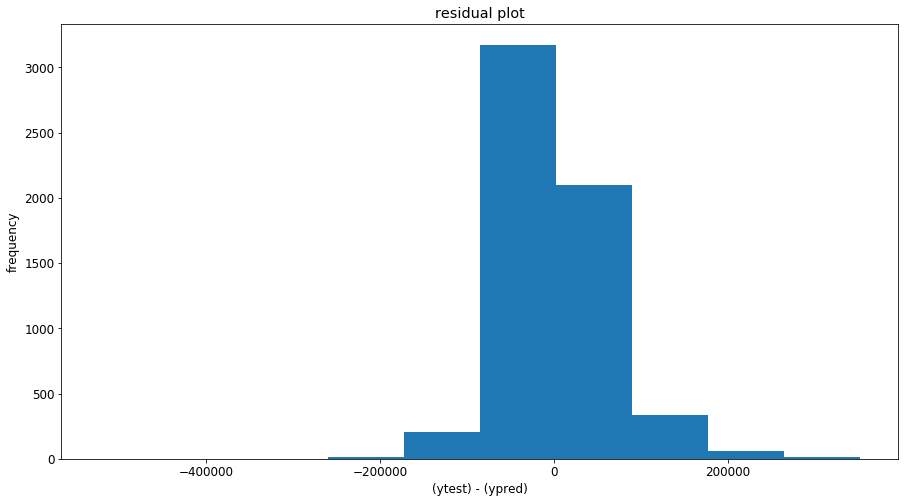

[]

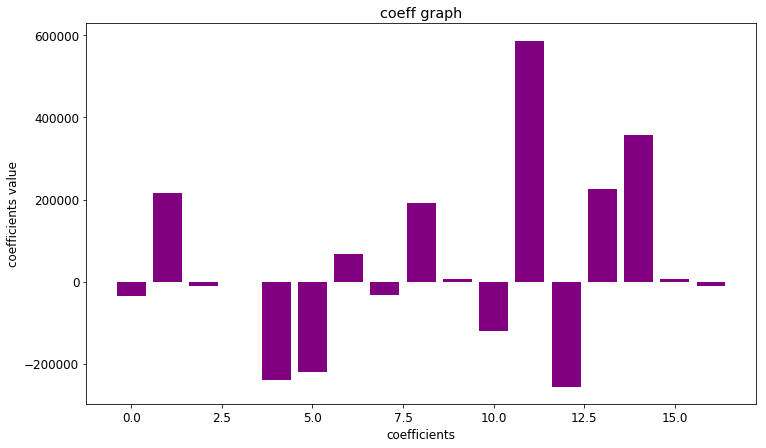

In [0]:
l=regresssor_model(xtrain,ytrain,Lasso)

evaluate(l.predict(xtest),ytest,l)
plt.figure(figsize=(12,7))

plt.bar(np.arange(len(l.coef_)),l.coef_,color='Purple')
plt.xlabel('coefficients')
plt.ylabel('coefficients value')
plt.title('coeff graph')
plt.plot()

Regression: ElasticNet

The cross validated accuracy  - 15.448029540979707
The corss validated variance is - 0.44812697444709965
root mean squared error for test data   is 90239.86770459576


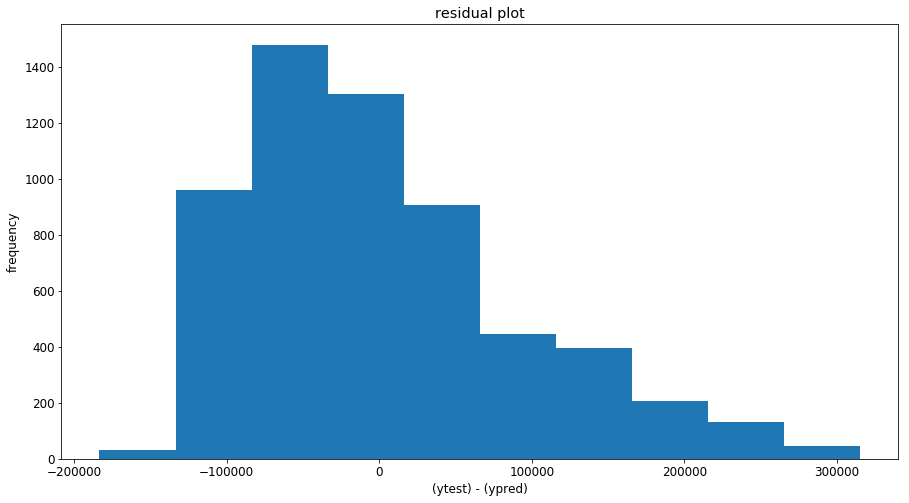

Text(0.5, 1.0, 'coeff graph')

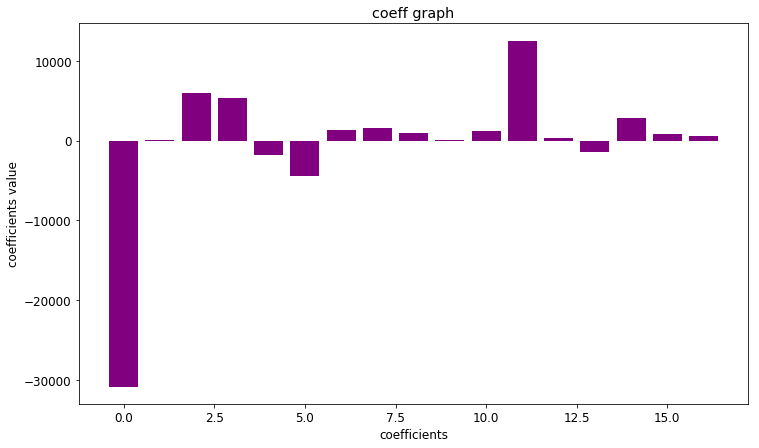

In [0]:
l=regresssor_model(xtrain,ytrain,ElasticNet)
evaluate(l.predict(xtest),ytest,l)
plt.figure(figsize=(12,7))
plt.bar(np.arange(len(l.coef_)),l.coef_,color='Purple')
plt.xlabel('coefficients')
plt.ylabel('coefficients value')
plt.title('coeff graph')

Regression: Ridge

The cross validated accuracy  - 63.99626617318987
The corss validated variance is - 2.055503554409005
root mean squared error for test data   is 58959.57570356879


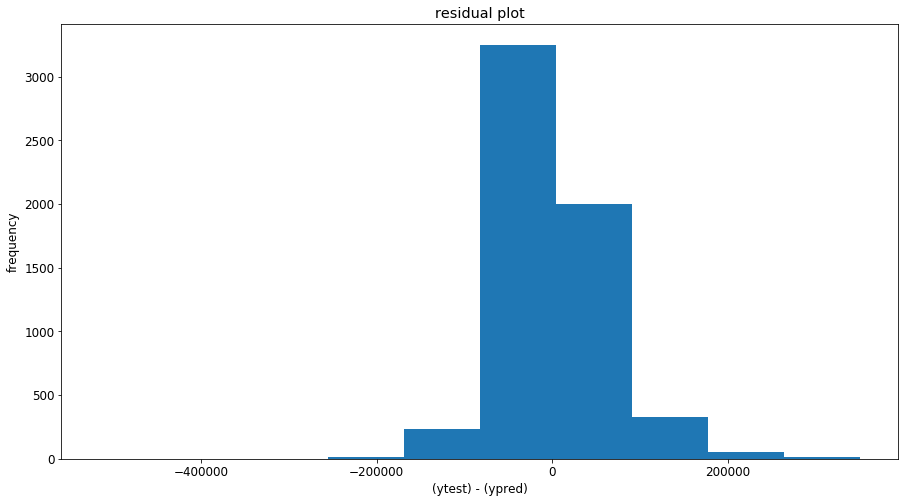

Text(0.5, 1.0, 'coeff graph')

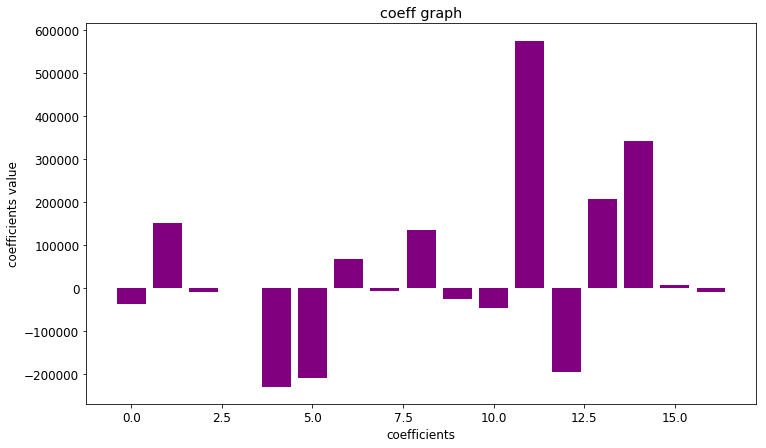

In [0]:
l=regresssor_model(xtrain,ytrain,Ridge)
evaluate(l.predict(xtest),ytest,l)
plt.figure(figsize=(12,7))
plt.bar(np.arange(len(l.coef_)),l.coef_,color='Purple')
plt.xlabel('coefficients')
plt.ylabel('coefficients value')
plt.title('coeff graph')

In [0]:
#initantiate the linear regression
linearRegModel = LinearRegression(n_jobs=-1)
#fit the model to the training data (learn the coefficients)
linearRegModel.fit(xtrain,ytrain)
#print the intercept and coefficients 
print("Intercept is "+str(linearRegModel.intercept_))
print("coefficients  is "+str(linearRegModel.coef_))

Intercept is 201156.80334326264
coefficients  is [ -34603.20020214  222823.53934464  -11121.51194332    -825.03695725
 -241881.00317353 -220499.50560266   68319.63168918  -41802.81628251
  207739.00516256   16315.73076703 -139096.12355255  588720.34861304
 -261247.36506067  223434.22307953  361381.36273267    5327.57721137
  -10178.86181698]


In [0]:
#predict on the test data
ypred = linearRegModel.predict(xtest)

In [0]:
print(len(ypred))
print(len(ytest))
print(ypred[0:5])
print(ytest[0:5])

5902
5902
[217901.43841347 176182.26181172 125911.47202911 166858.85251869
 187581.62458753]
[184900 161300 100000 248100 187500]


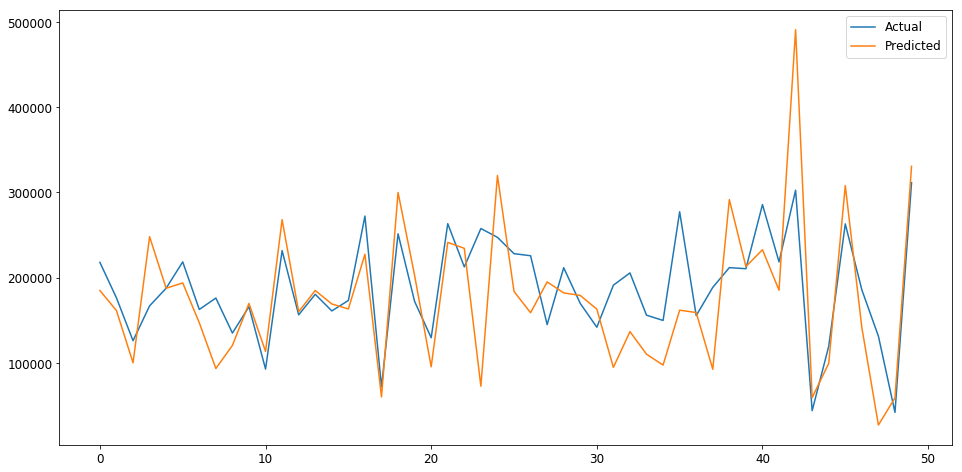

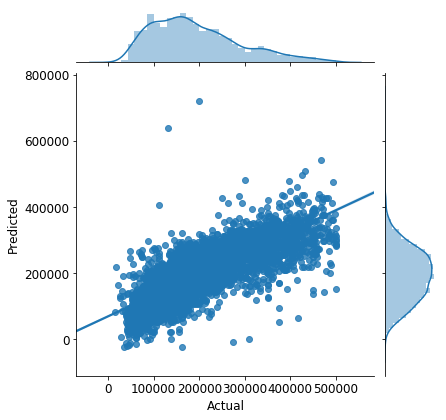

In [0]:
test = pd.DataFrame({'Predicted':ypred,'Actual':ytest})
fig= plt.figure(figsize=(16,8))
test = test.reset_index()
test = test.drop(['index'],axis=1)
plt.plot(test[:50])
plt.legend(['Actual','Predicted'])
sns.jointplot(x='Actual',y='Predicted',data=test,kind='reg',);

In [0]:
from sklearn.metrics import mean_squared_error

Root Mean Squared Error (RMSE)

**7. Perform Decision Tree Regression :**

Perform Decision Tree Regression on training data.
Predict output for test dataset using the fitted model.
Print root mean squared error from Decision Tree Regression.

In [0]:
# Load libraries
import pandas as pd
from sklearn.model_selection import cross_val_score
from sklearn.tree import DecisionTreeClassifier # Import Decision Tree Classifier
from sklearn.model_selection import train_test_split # Import train_test_split function
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation

In [0]:
# Import DecisionTreeClassifier from sklearn.tree
from sklearn.tree import DecisionTreeClassifier

# Instantiate a DecisionTreeClassifier 'dt'
dt = DecisionTreeClassifier(criterion = 'entropy' , random_state = 48)

# Fit dt to the training set
dt.fit(xtrain,ytrain)

DecisionTreeClassifier(class_weight=None, criterion='entropy', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=48, splitter='best')

In [0]:
# Predict test set labels
ypred = dt.predict(xtest)
from sklearn.metrics import r2_score
print("Model Score for Training data: {}".format(dt.score(xtrain,ytrain)))
print("Model Score for Testing data: {}".format(r2_score(ytest,ypred)))
print("Root Mean Squared Error is {}".format(np.sqrt(mean_squared_error(ytest,ypred))))

Model Score for Training data: 1.0
Model Score for Testing data: 0.354540103272715
Root Mean Squared Error is 78747.95306737453


In [0]:
# Import accuracy_score
from sklearn.metrics import accuracy_score

# Compute test set accuracy  
acc = accuracy_score(ytest, ypred,normalize=False)
print("Test set accuracy: {:.2f}".format(acc))

Test set accuracy: 13.00


In [0]:
# Instantiate a DecisionTreeClassifier 'dt' with a maximum depth of 6
dt = DecisionTreeClassifier(criterion = 'entropy' , max_depth = 6, random_state = 100)
# Fit dt to the training set
dt.fit(xtrain,ytrain)
# Predict test set labels
ypred = dt.predict(xtest)
from sklearn.metrics import r2_score
print("Model Score for Training data: {}".format(dt.score(xtrain,ytrain)))
print("Model Score for Testing data: {}".format(r2_score(ytest,ypred)))
print("Root Mean Squared Error is {}".format(np.sqrt(mean_squared_error(ytest,ypred))))

Model Score for Training data: 0.018081475564592258
Model Score for Testing data: 0.13497801135511145
Root Mean Squared Error is 91162.91746281632


In [0]:
dt=regresssor_model(xtrain,ytrain,DecisionTreeRegressor)
dt.fit(xtrain,ytrain)
print('mean squared errror is',end='\t-')
np.sqrt(mean_squared_error(ytest,dt.predict(xtest)))

The cross validated accuracy  - 54.877537484178916
The corss validated variance is - 2.667092702545318
mean squared errror is	-

63965.980929976555

In [0]:
dt.fit(xtrain,ytrain)
print('mean squared errror is',end='\t-')
np.sqrt(mean_squared_error(ytest,dt.predict(xtest)))

mean squared errror is	-

63929.563638813735

In [0]:
cv=cross_val_score(dt,xtrain,ytrain,scoring='r2',cv=10)
cv.std()
cv.mean()

0.5474188077091922

In [0]:
from sklearn.metrics import accuracy_score

In [0]:
params=[{
            
            'max_depth':[2,3,4,5,6,10,20,30,40,50,60,70,100],
            'min_samples_split':[2,3,4,7,10,12],
            'min_samples_leaf' :[1,3,5,10,15,20,25],
            'max_features':['sqrt','log2'],
            
        }
        ]

from sklearn.model_selection import GridSearchCV
gc=GridSearchCV(dt,params,cv=10,scoring='r2',n_jobs=-1)
gc.fit(xtrain,ytrain)
gc.best_estimator_

DecisionTreeRegressor(criterion='mse', max_depth=40, max_features='sqrt',
                      max_leaf_nodes=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=20,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      presort=False, random_state=None, splitter='best')

In [0]:
gc.best_score_

0.657360680032154

In [0]:
dt=gc.best_estimator_
dt.fit(xtrain,ytrain)
print('root mean squared error')
np.sqrt(mean_squared_error(ytest,dt.predict(xtest)))

root mean squared error


56836.64652292038

In [0]:
dtReg_y_pred = dt.predict(xtest)
dtReg_y_pred
print(len(dtReg_y_pred))
print(len(ytest))
print(dtReg_y_pred[0:5])
print(ytest[0:5])

5902
5902
[205690.         163453.57142857 102730.76923077 186665.78947368
 185130.3030303 ]
[184900 161300 100000 248100 187500]


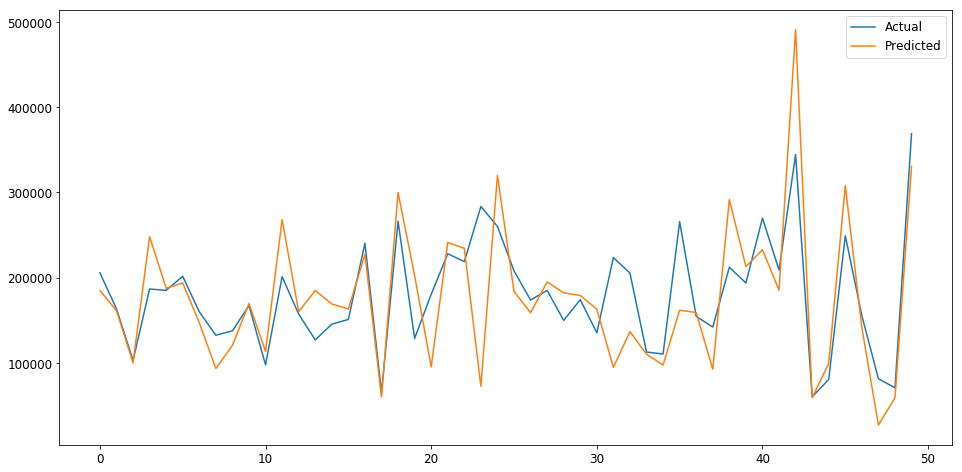

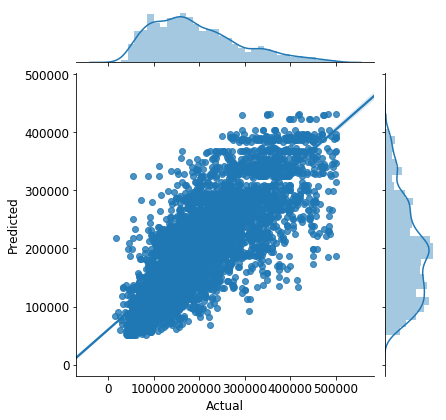

In [0]:
test = pd.DataFrame({'Predicted':dtReg_y_pred,'Actual':ytest})
fig= plt.figure(figsize=(16,8))
test = test.reset_index()
test = test.drop(['index'],axis=1)
plt.plot(test[:50])
plt.legend(['Actual','Predicted'])
sns.jointplot(x='Actual',y='Predicted',data=test,kind="reg")

Text(0.5, 1.0, 'feature importance')

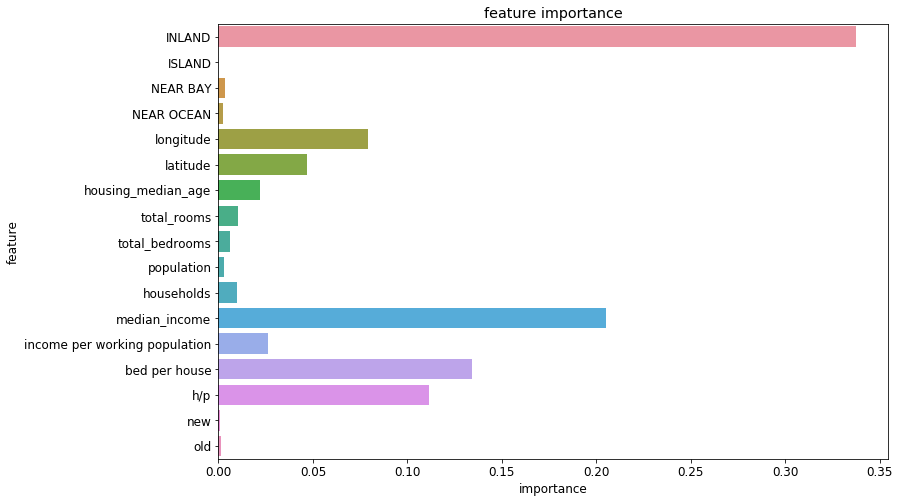

In [0]:
plt.figure(figsize=(12,8))
data=pd.DataFrame({'feature':df.columns[df.columns!='median_house_value'].values,"importance":dt.feature_importances_})
sns.barplot(data=data,y='feature',x='importance')
plt.title('feature importance')

In [0]:
print(data)

                          feature  importance
0                          INLAND    0.337491
1                          ISLAND    0.000000
2                        NEAR BAY    0.003263
3                      NEAR OCEAN    0.002399
4                       longitude    0.079156
5                        latitude    0.046901
6              housing_median_age    0.021830
7                     total_rooms    0.010535
8                  total_bedrooms    0.006288
9                      population    0.003057
10                     households    0.009935
11                  median_income    0.205218
12  income per working population    0.026086
13                  bed per house    0.134390
14                            h/p    0.111326
15                            new    0.000614
16                            old    0.001512


In [0]:
from sklearn.model_selection import cross_val_score

tree_scores = cross_val_score(dt,xtrain,ytrain,
                              scoring="neg_mean_squared_error", cv=10)
tree_rmse_scores = np.sqrt(-tree_scores)

def display_scores(scores):
    print("Root mean square error scores:", scores)
    print("Mean:", scores.mean())
    print("Standard deviation:", scores.std())

display_scores(tree_rmse_scores)

Root mean square error scores: [60111.35126757 58524.35325116 58825.77139698 61184.1899015
 61927.55951148 61206.72236827 59874.05059693 61437.589974
 57921.79263476 60062.41331942]
Mean: 60107.57942220742
Standard deviation: 1281.8873449536918


In [0]:
from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO  
from IPython.display import Image  
import pydotplus

/usr/local/lib/python3.6/dist-packages/sklearn/externals/six.py:31: DeprecationWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", DeprecationWarning)


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.648684 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.648684 to fit



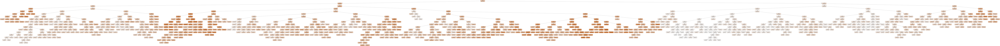

In [0]:
dot_data = StringIO()
export_graphviz(dt, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('CA_Housing.png')
Image(graph.create_png())

**8. Perform Random Forest Regression :**

Perform Random Forest Regression on training data.
Predict output for test dataset using the fitted model.
Print RMSE (root mean squared error) from Random Forest Regression.

In [0]:
rg=RandomForestRegressor(n_estimators=30,random_state=10,verbose=1)
rg.fit(xtrain,ytrain)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  30 out of  30 | elapsed:    5.1s finished


RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
                      max_features='auto', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, n_estimators=30,
                      n_jobs=None, oob_score=False, random_state=10, verbose=1,
                      warm_start=False)

In [0]:
print(np.sqrt(mean_squared_error(ytest,rg.predict(xtest))))

46359.231787594064


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  30 out of  30 | elapsed:    0.1s finished


In [0]:
print(rg.score(xtest,ytest))

0.7763014453759931


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  30 out of  30 | elapsed:    0.1s finished


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  30 out of  30 | elapsed:    0.1s finished


(array([3.000e+00, 4.000e+00, 5.900e+01, 5.120e+02, 3.792e+03, 1.228e+03,
        2.220e+02, 6.600e+01, 1.200e+01, 4.000e+00]),
 array([-300813.33333333, -237751.66666667, -174690.        ,
        -111628.33333333,  -48566.66666667,   14495.        ,
          77556.66666667,  140618.33333333,  203680.        ,
         266741.66666667,  329803.33333333]),
 <a list of 10 Patch objects>)

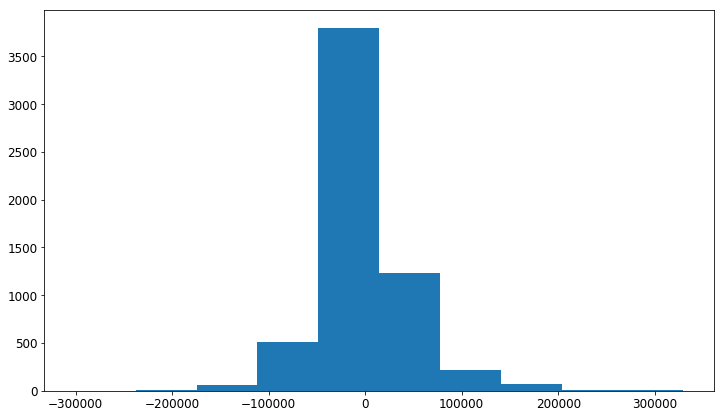

In [0]:
plt.figure(figsize=(12,7))
plt.hist(ytest-rg.predict(xtest))

In [0]:
params=[{
            'n_estimators':[20,30,70,50,100,200,300,400,600,650,630,680],
            'max_depth':[10,20,30,40,50,60,70,100],
            'min_samples_split':[2,3,4,5,10],
            'min_samples_leaf' :[1,2,5,7,10],
            'bootstrap':[True,False],
            'max_features':['sqrt','auto']
            
            
        }
]

In [0]:
np.sqrt(mean_squared_error(ytest,rg.predict(xtest)))

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  30 out of  30 | elapsed:    0.1s finished


46359.231787594064

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  30 out of  30 | elapsed:    0.1s finished


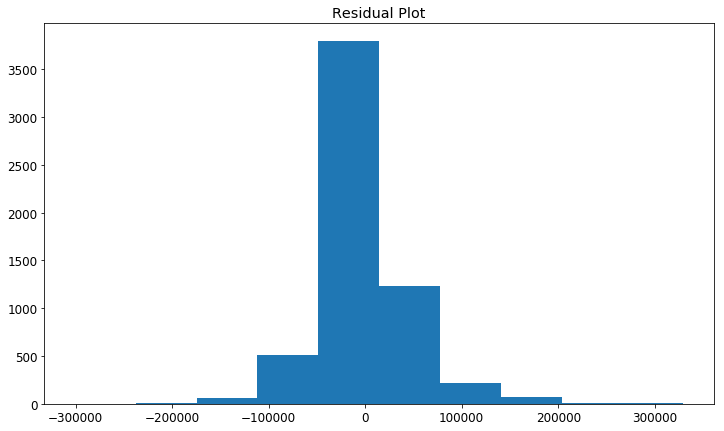

In [0]:
plt.figure(figsize=(12,7))
plt.title('Residual Plot')
plt.hist(ytest-rg.predict(xtest))
plt.show()

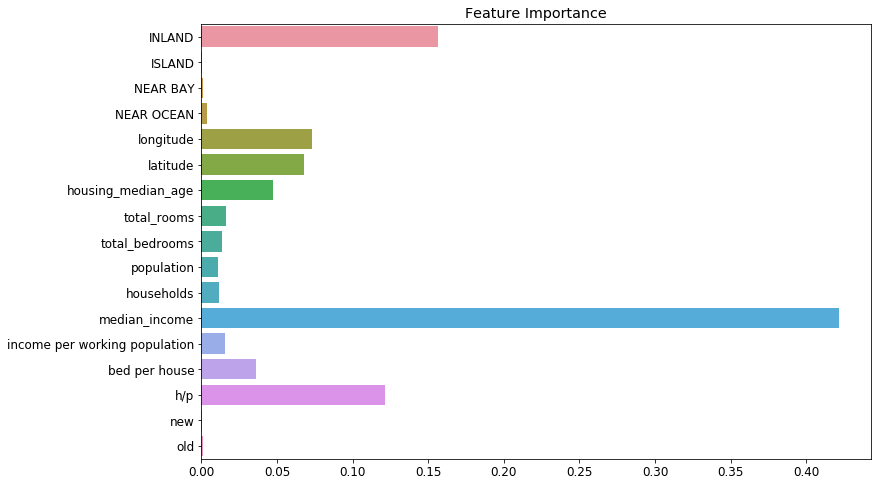

In [0]:
plt.figure(figsize=(12,8))
plt.title('Feature Importance')

sns.barplot(data={'importance':rg.feature_importances_,'feature':df.columns[df.columns!='median_house_value']},y='feature',x='importance')

rmse value is 44224.86961504549
r squared value is 0.7964252833662774


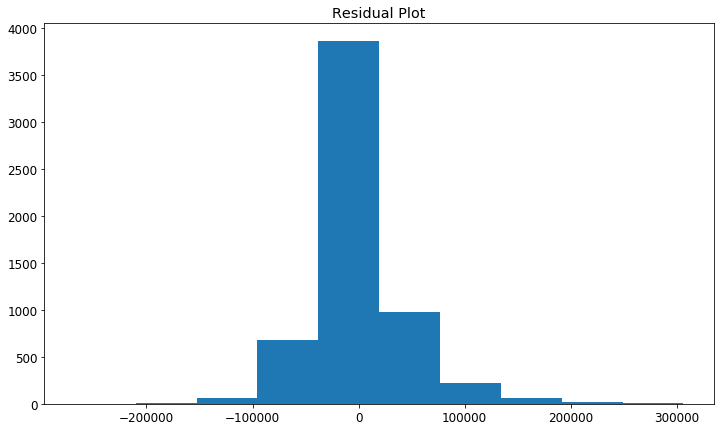

In [0]:
rg=RandomForestRegressor(bootstrap=False, criterion='mse', max_depth=100,
           max_features='sqrt', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=3,
           min_weight_fraction_leaf=0.0, n_estimators=630, n_jobs=1,
           oob_score=False, verbose=0, warm_start=False)
rg.fit(xtrain[:,[0,4,5,6,7,11,12,13,14]],ytrain)
print('rmse value is '+str(np.sqrt(mean_squared_error(ytest,rg.predict(xtest[:,[0,4,5,6,7,11,12,13,14]])))))
print('r squared value is '+str(rg.score(xtest[:,[0,4,5,6,7,11,12,13,14]],ytest)))

plt.figure(figsize=(12,7))
plt.title('Residual Plot')
plt.hist(ytest-rg.predict(xtest[:,[0,4,5,6,7,11,12,13,14]]))
plt.show()

In [0]:
rg=RandomForestRegressor(n_estimators=400)
rg.fit(xtrain[:,11:12],ytrain)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
                      max_features='auto', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, n_estimators=400,
                      n_jobs=None, oob_score=False, random_state=None,
                      verbose=0, warm_start=False)

In [0]:
x_t=np.arange(min(xtest[:,11]),max(xtest[:,11]),0.005)
x_t=x_t.reshape(len(x_t),1)

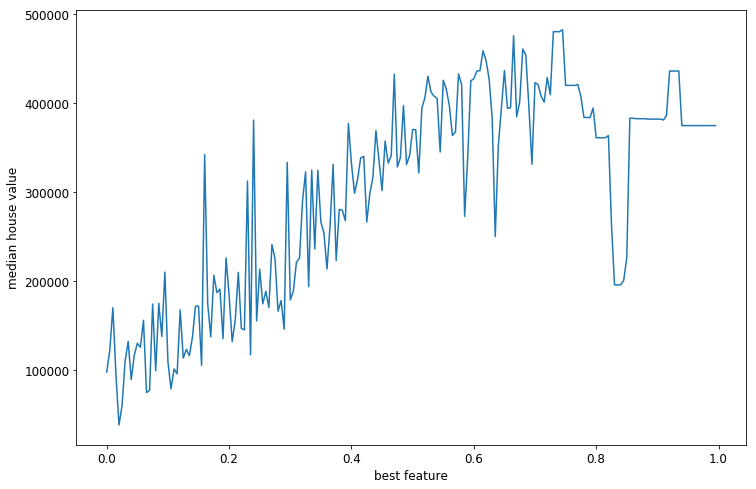

In [0]:
plt.figure(figsize=(12,8))
plt.xlabel("best feature")
plt.ylabel("median house value")
plt.plot(x_t,rg.predict(x_t))

In [0]:
rfReg = RandomForestRegressor(30)
rfReg.fit(xtrain,ytrain)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
                      max_features='auto', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, n_estimators=30,
                      n_jobs=None, oob_score=False, random_state=None,
                      verbose=0, warm_start=False)

In [0]:
rfReg_y_pred = rfReg.predict(xtest)
print(len(rfReg_y_pred))
print(len(ytest))
print(rfReg_y_pred[0:5])
print(ytest[0:5])

5902
5902
[202010.         196750.         106733.33333333 180783.33333333
 189820.        ]
[184900 161300 100000 248100 187500]


In [0]:
print(np.sqrt(metrics.mean_squared_error(ytest,rfReg_y_pred)))

46632.70935553291


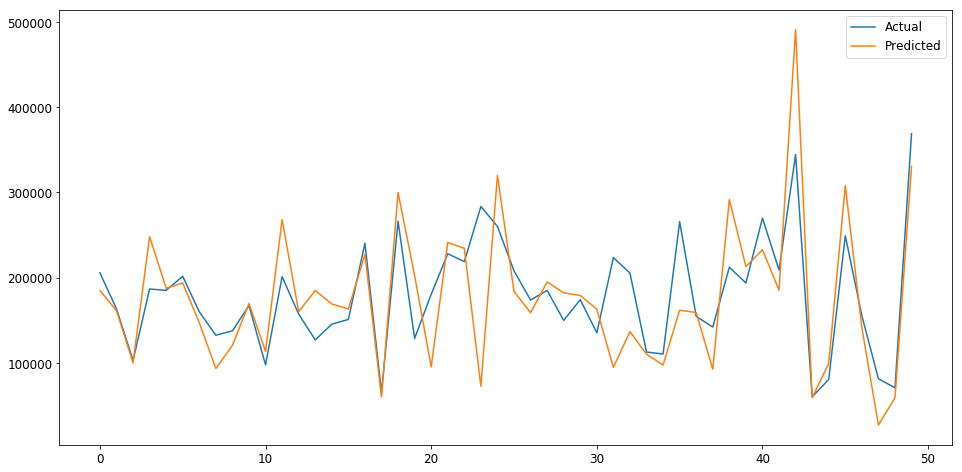

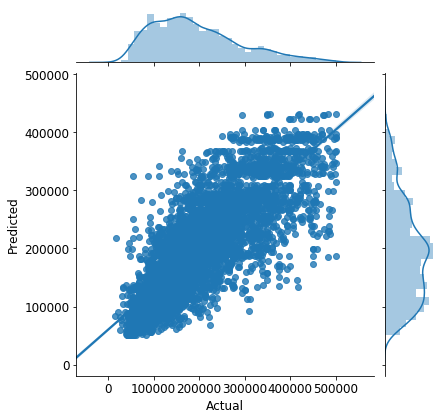

In [0]:
test = pd.DataFrame({'Predicted':dtReg_y_pred,'Actual':ytest})
fig= plt.figure(figsize=(16,8))
test = test.reset_index()
test = test.drop(['index'],axis=1)
plt.plot(test[:50])
plt.legend(['Actual','Predicted'])
sns.jointplot(x='Actual',y='Predicted',data=test,kind="reg")

**9. Bonus exercise: Perform Linear Regression with one independent variable :**

Extract just the median_income column from the independent variables (from X_train and X_test).
Perform Linear Regression to predict housing values based on median_income.
Predict output for test dataset using the fitted model.
Plot the fitted model for training data as well as for test data to check if the fitted model satisfies the test data.

In [0]:
#import the necessary libraries required 
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pandas.plotting import scatter_matrix
from sklearn.preprocessing import Imputer
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor

from sklearn import metrics

#%matplotlib notebook
%matplotlib inline

In [0]:
import os
base_dir = '/content/drive/My Drive/ML_Project/1553768847_housing.xlsx'

In [0]:
df = pd.read_excel(base_dir, sheetname='housing')

/usr/local/lib/python3.6/dist-packages/pandas/util/_decorators.py:188: FutureWarning: The `sheetname` keyword is deprecated, use `sheet_name` instead
  return func(*args, **kwargs)


In [0]:
#Content Check
print(os.listdir("../content"))

['.config', 'CA_Housing.png', 'drive', 'sample_data']


In [0]:
housing = df
print("The number of rows and colums are {} and also called shape of the matrix".format(housing.shape))
print("Columns names are \n {}".format(housing.columns))

The number of rows and colums are (20640, 10) and also called shape of the matrix
Columns names are 
 Index(['longitude', 'latitude', 'housing_median_age', 'total_rooms',
       'total_bedrooms', 'population', 'households', 'median_income',
       'ocean_proximity', 'median_house_value'],
      dtype='object')


In [0]:
#EDA
print(housing.head())

   longitude  latitude  ...  ocean_proximity  median_house_value
0    -122.23     37.88  ...         NEAR BAY              452600
1    -122.22     37.86  ...         NEAR BAY              358500
2    -122.24     37.85  ...         NEAR BAY              352100
3    -122.25     37.85  ...         NEAR BAY              341300
4    -122.25     37.85  ...         NEAR BAY              342200

[5 rows x 10 columns]


In [0]:
print(housing.tail())

       longitude  latitude  ...  ocean_proximity  median_house_value
20635    -121.09     39.48  ...           INLAND               78100
20636    -121.21     39.49  ...           INLAND               77100
20637    -121.22     39.43  ...           INLAND               92300
20638    -121.32     39.43  ...           INLAND               84700
20639    -121.24     39.37  ...           INLAND               89400

[5 rows x 10 columns]


In [0]:
print(housing.dtypes)

longitude             float64
latitude              float64
housing_median_age      int64
total_rooms             int64
total_bedrooms        float64
population              int64
households              int64
median_income         float64
ocean_proximity        object
median_house_value      int64
dtype: object


<Figure size 432x288 with 0 Axes>

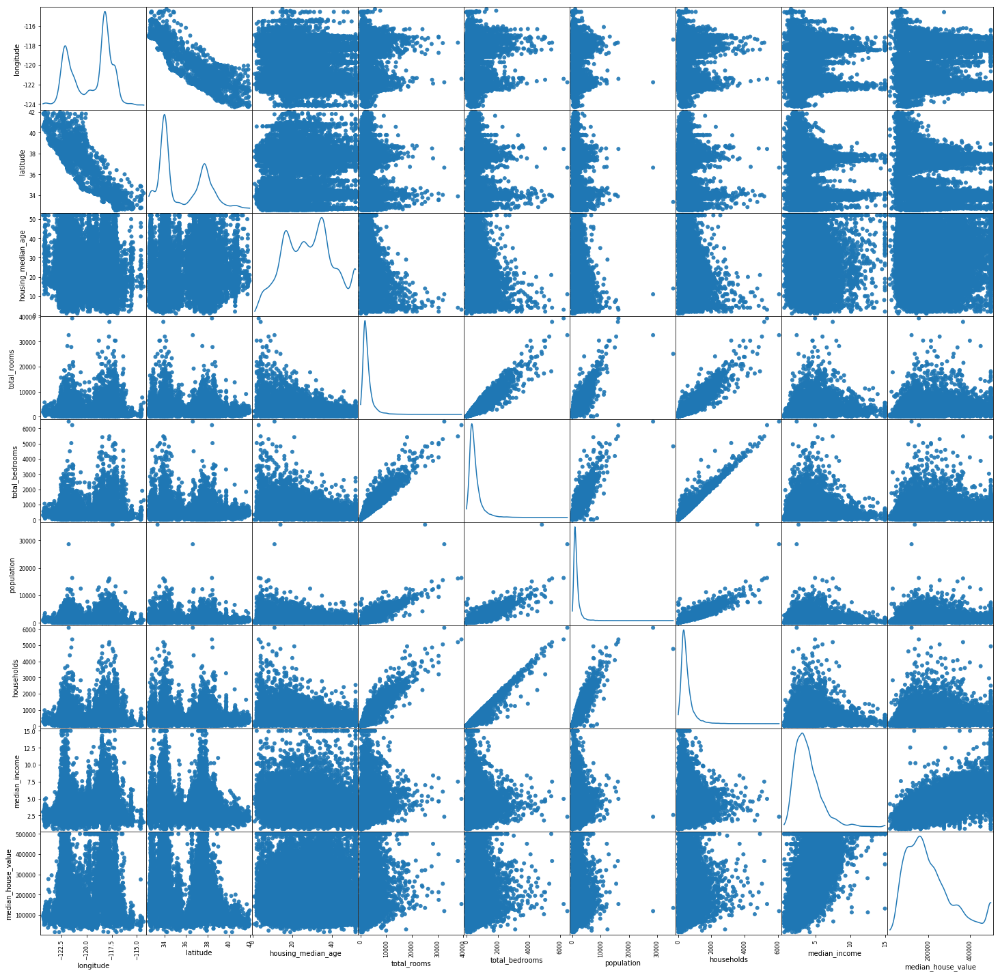

In [0]:
#display scatter_matrix also
fig = plt.figure()
scatter_matrix(housing,figsize =(25,25),alpha=0.9,diagonal="kde",marker="o");

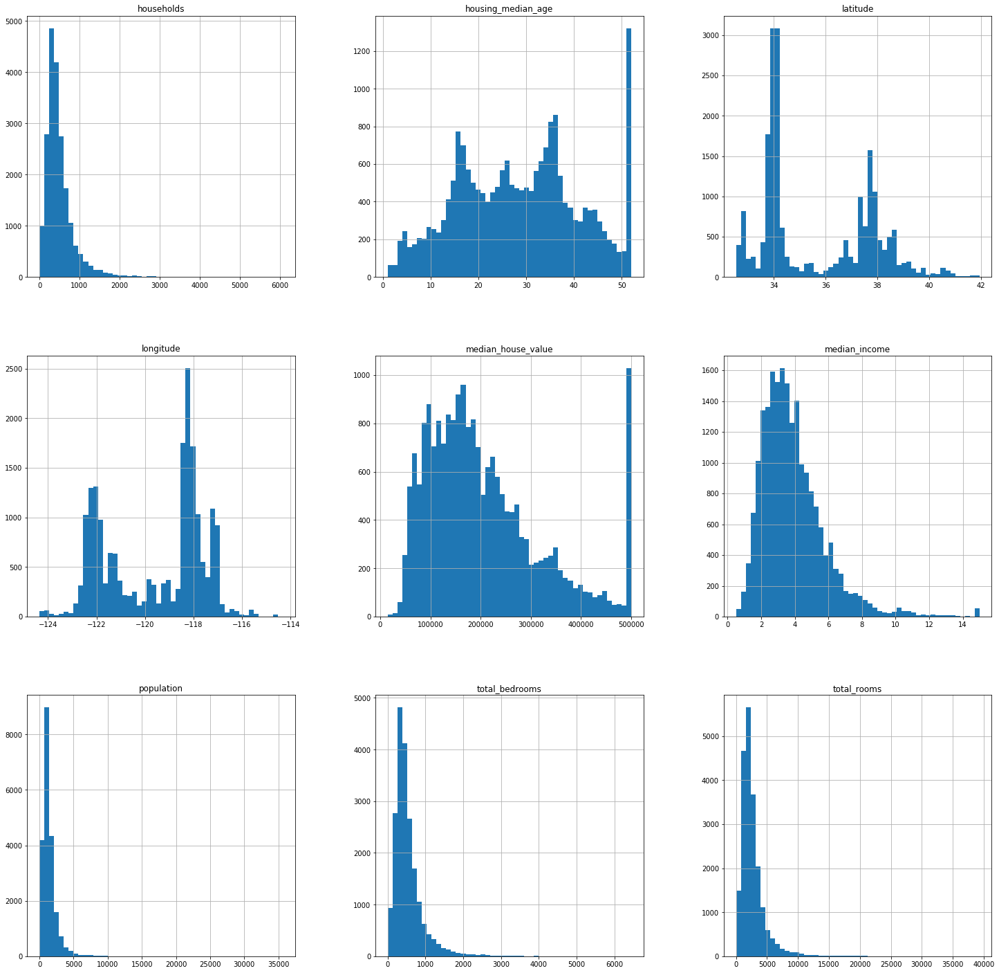

In [0]:
housing.hist(figsize=(25,25),bins=50);

In [0]:
hcorr = housing.corr()
hcorr.style.background_gradient()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
longitude,1,-0.924664,-0.108197,0.044568,0.069608,0.0997732,0.0553101,-0.0151759,-0.0459666
latitude,-0.924664,1,0.0111727,-0.0360996,-0.0669828,-0.108785,-0.0710354,-0.0798091,-0.14416
housing_median_age,-0.108197,0.0111727,1,-0.361262,-0.320451,-0.296244,-0.302916,-0.119034,0.105623
total_rooms,0.044568,-0.0360996,-0.361262,1,0.93038,0.857126,0.918484,0.19805,0.134153
total_bedrooms,0.069608,-0.0669828,-0.320451,0.93038,1,0.877747,0.979728,-0.00772285,0.0496862
population,0.0997732,-0.108785,-0.296244,0.857126,0.877747,1,0.907222,0.00483435,-0.0246497
households,0.0553101,-0.0710354,-0.302916,0.918484,0.979728,0.907222,1,0.0130331,0.0658427
median_income,-0.0151759,-0.0798091,-0.119034,0.19805,-0.00772285,0.00483435,0.0130331,1,0.688075
median_house_value,-0.0459666,-0.14416,0.105623,0.134153,0.0496862,-0.0246497,0.0658427,0.688075,1


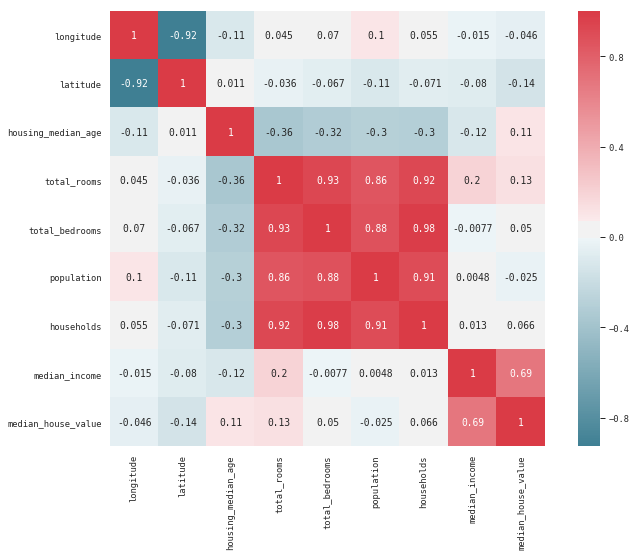

In [0]:
#heatmap using seaborn
#set the context for plotting 
sns.set(context="paper",font="monospace")
housing_corr_matrix = housing.corr()
#set the matplotlib figure
fig, axe = plt.subplots(figsize=(12,8))
#Generate color palettes 
cmap = sns.diverging_palette(220,10,center = "light", as_cmap=True)
#draw the heatmap
sns.heatmap(housing_corr_matrix,vmax=1,square =True, cmap=cmap,annot=True );

In [0]:
def getOutliers(dataframe,column):
    column = "total_rooms" 
    #housing[column].plot.box(figsize=(8,8))
    des = dataframe[column].describe()
    desPairs = {"count":0,"mean":1,"std":2,"min":3,"25":4,"50":5,"75":6,"max":7}
    Q1 = des[desPairs['25']]
    Q3 = des[desPairs['75']]
    IQR = Q3-Q1
    lowerBound = Q1-1.5*IQR
    upperBound = Q3+1.5*IQR
    print("(IQR = {})Outlier are anything outside this range: ({},{})".format(IQR,lowerBound,upperBound))
    #b = df[(df['a'] > 1) & (df['a'] < 5)]
    data = dataframe[(dataframe [column] < lowerBound) | (dataframe [column] > upperBound)]

    print("Outliers out of total = {} are \n {}".format(housing[column].size,len(data[column])))
    #remove the outliers from the dataframe
    outlierRemoved = housing[~housing[column].isin(data[column])]
    return outlierRemoved
#get the outlier
df_outliersRemoved = getOutliers(housing,"total_rooms")

(IQR = 1700.25)Outlier are anything outside this range: (-1102.625,5698.375)
Outliers out of total = 20640 are 
 1287


In [0]:
housing_ind = housing.drop("median_house_value",axis=1)
print(housing_ind.head())
housing_dep = housing["median_house_value"]
print("Medain Housing Values")
print(housing_dep.head())

   longitude  latitude  ...  median_income  ocean_proximity
0    -122.23     37.88  ...         8.3252         NEAR BAY
1    -122.22     37.86  ...         8.3014         NEAR BAY
2    -122.24     37.85  ...         7.2574         NEAR BAY
3    -122.25     37.85  ...         5.6431         NEAR BAY
4    -122.25     37.85  ...         3.8462         NEAR BAY

[5 rows x 9 columns]
Medain Housing Values
0    452600
1    358500
2    352100
3    341300
4    342200
Name: median_house_value, dtype: int64


In [0]:
#Extract median_income 
dropcol = ["longitude","latitude","housing_median_age","total_rooms","total_bedrooms","population","households","ocean_proximity"]
print(dropcol)
housing_med = housing_ind.drop(dropcol,axis=1)
print(type(housing_med))

['longitude', 'latitude', 'housing_median_age', 'total_rooms', 'total_bedrooms', 'population', 'households', 'ocean_proximity']
<class 'pandas.core.frame.DataFrame'>


In [0]:
#check for rand_state
X_train2,X_test2,y_train2,y_test2 = train_test_split(housing_med,housing_dep,test_size=0.2,random_state=42)
#print(X_train.head())
#print(X_test.head())
#print(y_train.head())
#print(y_test.head())
print("X_train2 shape {} and size {}".format(X_train2.shape,X_train2.size))
print("X_test2 shape {} and size {}".format(X_test2.shape,X_test2.size))
print("y_train2 shape {} and size {}".format(y_train2.shape,y_train2.size))
print("y_test2 shape {} and size {}".format(y_test2.shape,y_test2.size))

X_train2 shape (16512, 1) and size 16512
X_test2 shape (4128, 1) and size 4128
y_train2 shape (16512,) and size 16512
y_test2 shape (4128,) and size 4128


In [0]:
X_train2.head()

,median_income
14196,3.2596
8267,3.8125
17445,4.1563
14265,1.9425
2271,3.5542


In [0]:
#Standardize training and test datasets.
#==============================================================================
# Feature scaling is to bring all the independent variables in a dataset into
# same scale, to avoid any variable dominating  the model. Here we will not 
# transform the dependent variables.
#==============================================================================
independent_scaler = StandardScaler()
X_train2 = independent_scaler.fit_transform(X_train2)
X_test2 = independent_scaler.transform(X_test2)
print(X_train2[0:5,:])
print("test data")
print(X_test2[0:5,:])

[[-0.326196  ]
 [-0.03584338]
 [ 0.14470145]
 [-1.01786438]
 [-0.17148831]]
test data
[[-1.15508475]
 [-0.70865905]
 [-0.21040155]
 [ 0.97511311]
 [-0.08179356]]


In [0]:
linReg2 = LinearRegression()
linReg2.fit(X_train2,y_train2)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [0]:
y_pred2 = linReg2.predict(X_test2)
print(len(y_pred2))
print(len(y_test2))
print(y_pred2[0:5])
print(y_test2[0:5])

4128
4128
[114958.91676996 150606.88213964 190393.71844449 285059.38345102
 200663.31816103]
20046     47700
3024      45800
15663    500001
20484    218600
9814     278000
Name: median_house_value, dtype: int64


Text(0, 0.5, ' Predicted median_house_value')

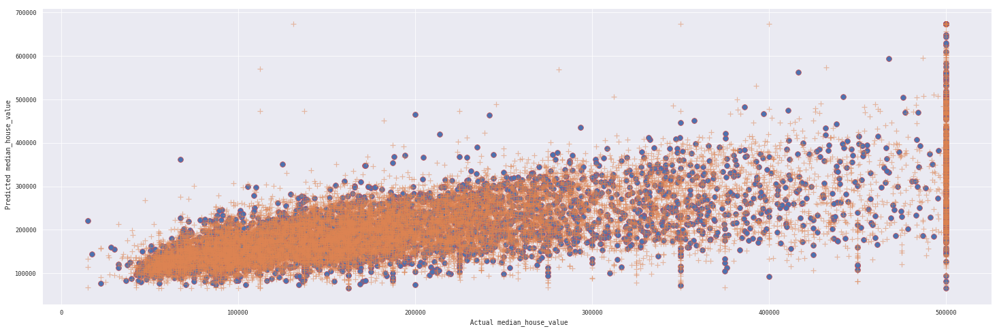

In [0]:
fig = plt.figure(figsize=(25,8))
plt.scatter(y_test2,y_pred2,marker="o",edgecolors ="r",s=60)
plt.scatter(y_train2,linReg2.predict(X_train2),marker="+",s=50,alpha=0.5)
plt.xlabel(" Actual median_house_value")
plt.ylabel(" Predicted median_house_value")

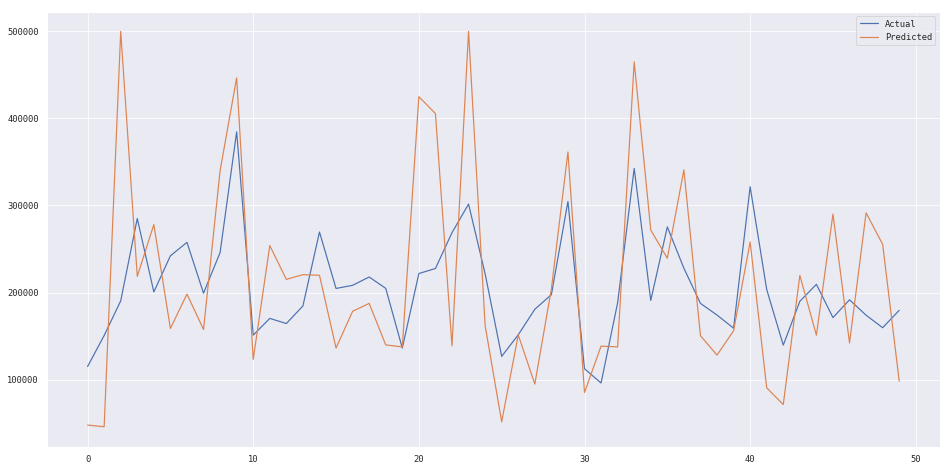

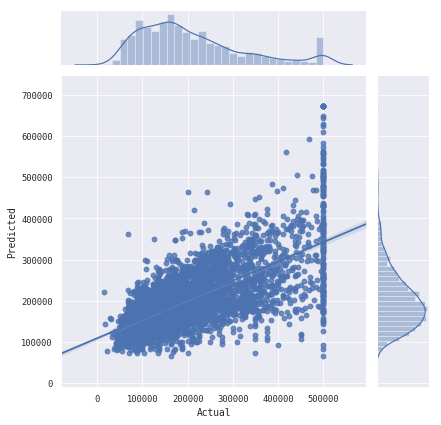

In [0]:
test = pd.DataFrame({'Predicted':y_pred2,'Actual':y_test2})
fig= plt.figure(figsize=(16,8))
test = test.reset_index()
test = test.drop(['index'],axis=1)
plt.plot(test[:50])
plt.legend(['Actual','Predicted'])
sns.jointplot(x='Actual',y='Predicted',data=test,kind="reg")

In [0]:
print(np.sqrt(metrics.mean_squared_error(y_test2,y_pred2)))

84209.01241414454


Dataset Description :

**Field	Description**
1. longitude	(signed numeric - float) : Longitude value for the block in California, USA
2. latitude	(numeric - float ) : Latitude value for the block in California, USA
3. housing_median_age	(numeric - int ) : Median age of the house in the block
4. total_rooms	(numeric - int ) : Count of the total number of rooms (excluding bedrooms) in all houses in the block
5. total_bedrooms	(numeric - float ) : Count of the total number of bedrooms in all houses in the block
6.population	(numeric - int ) : Count of the total number of population in the block
7. households	(numeric - int ) : Count of the total number of households in the block
8.median_income	(numeric - float ) : Median of the total household income of all the houses in the block
10.ocean_proximity	(numeric - categorical ) : Type of the landscape of the block [ Unique Values : 'NEAR BAY', '<1H OCEAN', 'INLAND', 'NEAR OCEAN', 'ISLAND'  ]
11.median_house_value	(numeric - int ) : Median of the household prices of all the houses in the block